# Experiment Notebook: Validator Revenue and Profit Yields

# Table of Contents
* [Experiment Summary](#Experiment-Summary)
* [Experiment Assumptions](#Experiment-Assumptions)
* [Experiment Setup](#Experiment-Setup)
* [Analysis 1: Revenue and Profit Yields Over Time](#Analysis-1:-Revenue-and-Profit-Yields-Over-Time)
* [Analysis 2: Revenue and Profit Yields Over ETH Staked](#Analysis-2:-Revenue-and-Profit-Yields-Over-ETH-Staked)
* [Analysis 3: Revenue and Profit Yields Over ETH Price](#Analysis-3:-Revenue-and-Profit-Yields-Over-ETH-Price)
* [Analysis 4: Profit Yields Over ETH Staked vs. ETH Price (Yield Surface)](#Analysis-4:-Profit-Yields-Over-ETH-Staked-vs.-ETH-Price)
* [Analysis 5: Profit Yields By Validator Environment Over Time](#Analysis-5:-Profit-Yields-By-Validator-Environment-Over-Time)

# Experiment Summary 

The purpose of this notebook is to explore the returns validators can expect from staking in the Ethereum protocol across different time horizons, adoption scenarios, ETH price scenarios, and validator environments.

# Experiment Assumptions

See [assumptions document](ASSUMPTIONS.md) for further details.

# Experiment Setup

We begin with several experiment-notebook-level preparatory setup operations:

* Import relevant dependencies
* Import relevant experiment templates
* Create copies of experiments
* Configure and customize experiments 

Analysis-specific setup operations are handled in their respective notebook sections.

In [1]:
import setup

import copy
import logging
import numpy as np
import pandas as pd

import experiments.notebooks.visualizations as visualizations
import model.constants as constants
from experiments.run import run
from experiments.utils import inspect_module
from model.types import Stage
from model.system_parameters import validator_environments
from model.state_variables import eth_staked, eth_supply

time: 694 ms (started: 2021-07-05 14:50:06 +02:00)


In [2]:
# Enable/disable logging
logger = logging.getLogger()
logger.disabled = True

time: 24.1 ms (started: 2021-07-05 14:50:07 +02:00)


In [3]:
# Import experiment templates
import experiments.templates.time_domain_analysis as time_domain_analysis
import experiments.templates.eth_staked_sweep_analysis as eth_staked_sweep_analysis
import experiments.templates.eth_price_sweep_analysis as eth_price_sweep_analysis
import experiments.templates.eth_price_eth_staked_grid_analysis as eth_price_eth_staked_grid_analysis

time: 3.93 s (started: 2021-07-05 14:50:07 +02:00)


In [4]:
# Inspect experiment template
inspect_module(eth_staked_sweep_analysis)

import numpy as np
import copy

from model.simulation_configuration import TIMESTEPS, DELTA_TIME
from model.state_variables import eth_staked, eth_supply, eth_price_max
from experiments.default_experiment import experiment
from model.types import Stage


# Make a copy of the default experiment to avoid mutation
experiment = copy.deepcopy(experiment)

eth_staked_samples = np.linspace(
    eth_staked,
    eth_supply * 0.3,  # 30% of current total ETH supply
    50
)

parameter_overrides = {
    "stage": [Stage.BEACON_CHAIN],
    "eth_staked_process": [
        lambda run, _timestep: eth_staked_samples[run - 1],
    ],
    "eth_price_process": [
        # A sweep of two fixed ETH price points
        lambda _run, _timestep: 100,
        lambda _run, _timestep: eth_price_max,
    ]
}

# Override default experiment parameters
experiment.simulations[0].model.params.update(parameter_overrides)
# Set runs to number of items in eth_staked_samples
experiment.simulations[0].runs = len(eth_staked_samples)
# Run single timestep, set unit of time to multiple epochs
experiment.simulations[0].timesteps = 1
experiment.simulations[0].model.params.update({"dt": [TIMESTEPS * DELTA_TIME]})

time: 107 ms (started: 2021-07-05 14:50:11 +02:00)


In [5]:
# Create a simulation for each analysis
simulation_1 = copy.deepcopy(time_domain_analysis.experiment.simulations[0])
simulation_2 = copy.deepcopy(eth_staked_sweep_analysis.experiment.simulations[0])
simulation_3 = copy.deepcopy(eth_price_sweep_analysis.experiment.simulations[0])
simulation_4 = copy.deepcopy(eth_price_eth_staked_grid_analysis.experiment.simulations[0])
simulation_5 = copy.deepcopy(time_domain_analysis.experiment.simulations[0])

time: 55 ms (started: 2021-07-05 14:50:11 +02:00)


# Analysis 1: Revenue and Profit Yields Over Time

This analysis allows the exploration of revenue and profit yields over time, and across three adoption scenarios:

* Normal adoption: assumes the current average new validators per-epoch from Beaconscan over the last 6 months
* Low adoption: assumes a 50% lower than average scenario
* High adoption: assumes a 50% higher than average scenario

The first chart ("Validator Adoption Scenarios") visualizes the three adoption scenarios (i.e. implied ETH staked over time) underlying Analysis 1. Please note that the High Adoption scenario has non-linear dynamics due to the validator activation queue rate limiting. To create custom adoption scenarios, add another entry to the `validator_process` System Parameter, with either a static per-epoch validator adoption rate, or generate a time-series using the current timestep to index the data.

The second chart ("Revenue and Profit Yields Over Time - At a Glance") visualizes both revenue and profit yields over time and across the three adoption scenarios (i.e. implied ETH staked over time). The ETH Price (relevant for profit yields) is by default set to the mean ETH price over the last 12 months. The higher the adoption, the lower both revenue and profit yields. The higher the price, the higher the profit yields - whereas validator costs are fixed in dollars, returns are in ETH and their equivalent dollar value depends on the current ETH price.

The third chart ("Revenue or Profit Yields Over Time") visualizes revenue yields or profit yields (choose via drop-down) over the chosen time frame, and across the three adoption scenarios  (i.e. implied ETH staked over time) and ETH price range. In simple terms, this chart visualizes how validators can expect the yield dynamics to change over different adoption and price scenarios. The higher the adoption, the lower both revenue and profit yields. The higher the price, the higher the profit yields.

The fourth chart ("Cumulative Average Revenue or Profit Yields Over Time") visualizes the cumulative average revenue yields or profit yields (choose via drop-down) over the chosen time frame, and across the three adoption scenarios (i.e. implied ETH staked over time) and ETH price range. In simple terms, this chart visualizes the effective yields a validator can expect over the respective time horizons if they start validating today. The higher the adoption, the lower both revenue and profit yields. The higher the price, the higher the profit yields.

In [6]:
simulation_1.model.params.update({
    'stage': [Stage.BEACON_CHAIN],
    'validator_process': [
        lambda _run, _timestep: 3,  # Normal adoption: current average active validators per epoch from Beaconscan
        lambda _run, _timestep: 3 * 0.5,  # Low adoption: 50% lower scenario
        lambda _run, _timestep: 3 * 1.5,  # High adoption: 50% higher scenario
    ],
})

time: 28.6 ms (started: 2021-07-05 14:50:11 +02:00)


In [7]:
df_1, _exceptions = run(simulation_1)

time: 4 s (started: 2021-07-05 14:50:11 +02:00)


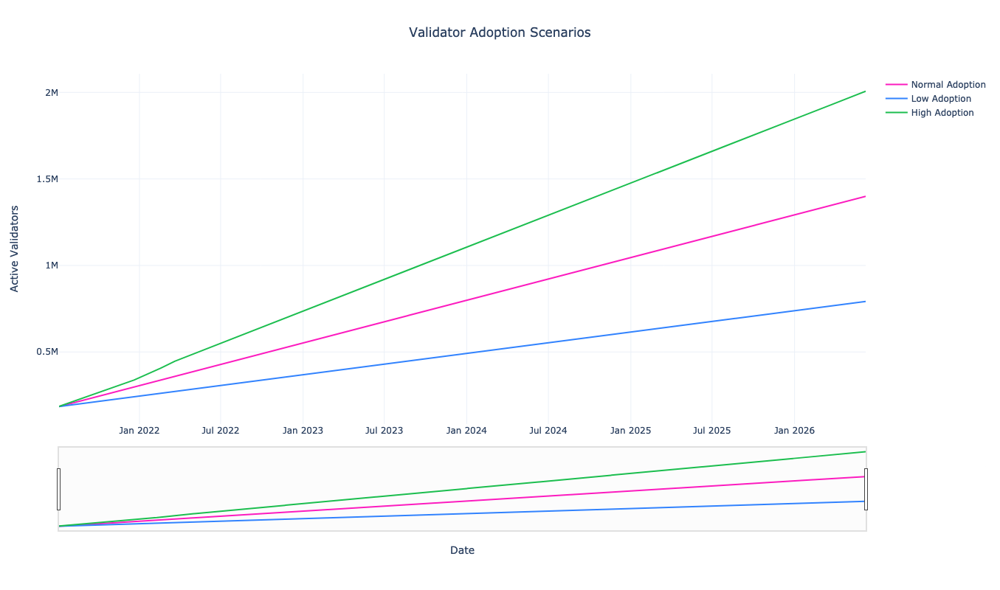

time: 637 ms (started: 2021-07-05 14:50:15 +02:00)


In [8]:
visualizations.plot_number_of_validators_over_time_foreach_subset(df_1)

The chart below visualizes revenue and profit yields over time and across the three adoption scenarios shown above (i.e. implied ETH staked over time). The higher the adoption, the lower both revenue and profit yields.

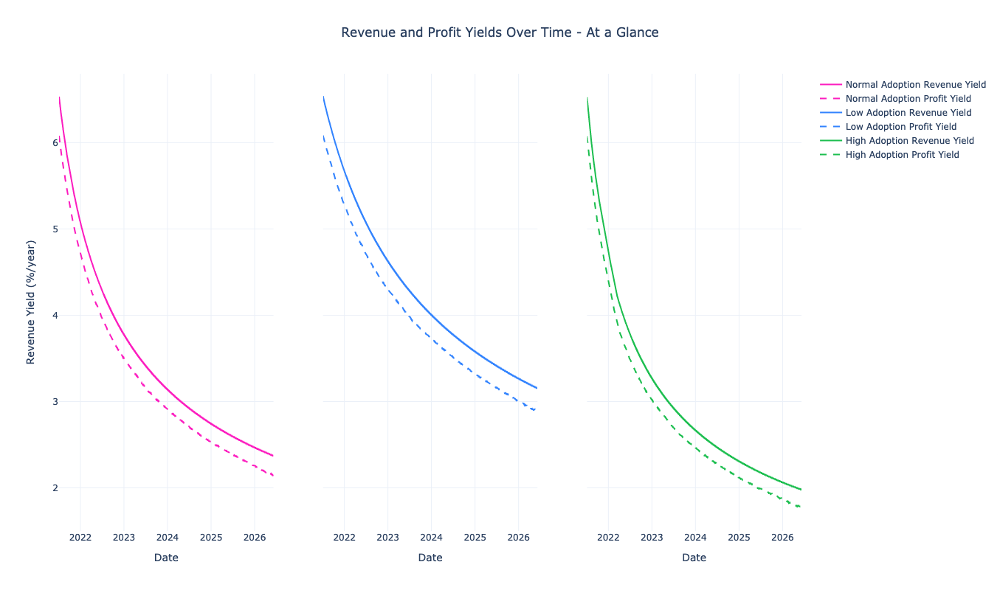

time: 1.08 s (started: 2021-07-05 14:50:16 +02:00)


In [9]:
visualizations.plot_revenue_profit_yields_over_time_foreach_subset_subplots(df_1)

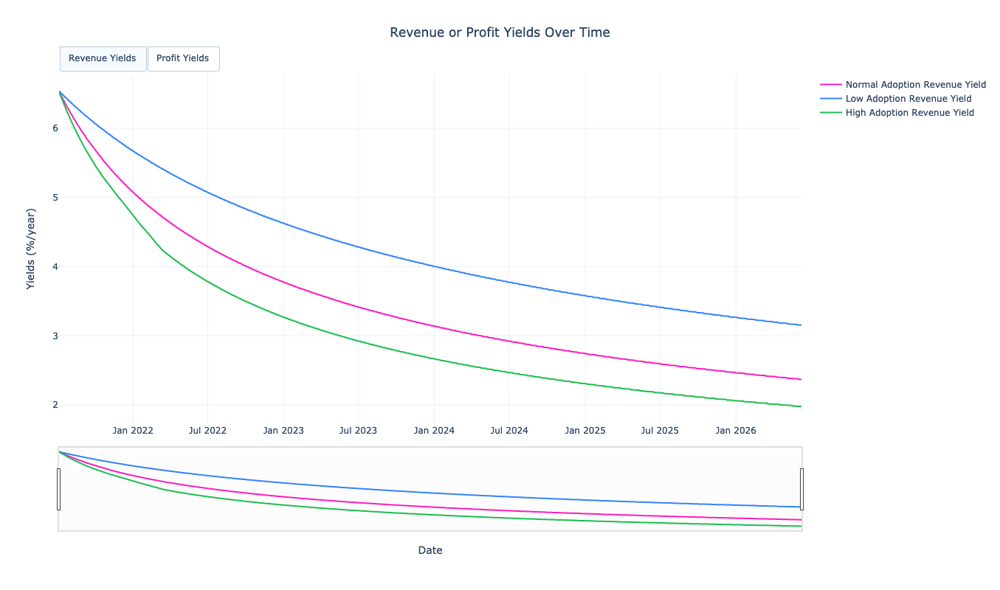

time: 1.32 s (started: 2021-07-05 14:50:17 +02:00)


In [10]:
visualizations.plot_revenue_profit_yields_over_time_foreach_subset(df_1)

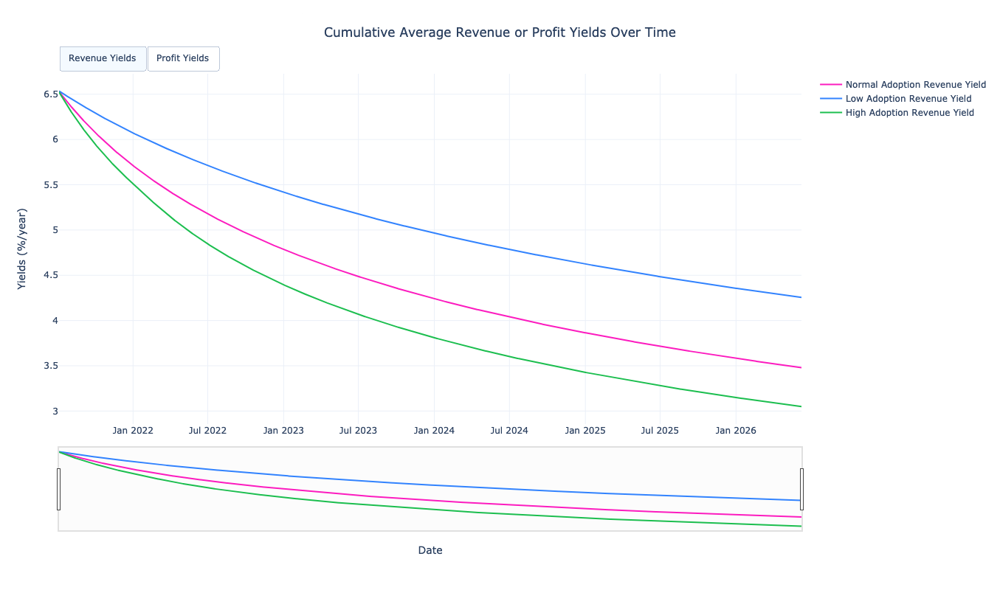

time: 1.29 s (started: 2021-07-05 14:50:18 +02:00)


In [11]:
visualizations.plot_expanding_mean_revenue_profit_yields_over_time_foreach_subset(df_1)

# Analysis 2: Revenue and Profit Yields Over ETH Staked

This analysis allows the exploration of revenue and profit yields over a large range of ETH staked. Compared to Analysis 1 (which assumed ETH staked ranges as part of the adoption scenarios), Analysis 2 explicit shows the yields validators can expect at certain points in the validator adoption curve. Profit yields are sensitive to ETH price (USD/ETH) and plotted at 100 USD/ETH and the maximum ETH price over the last 12 months.

In [12]:
df_2, _exceptions = run(simulation_2)

time: 300 ms (started: 2021-07-05 14:50:20 +02:00)


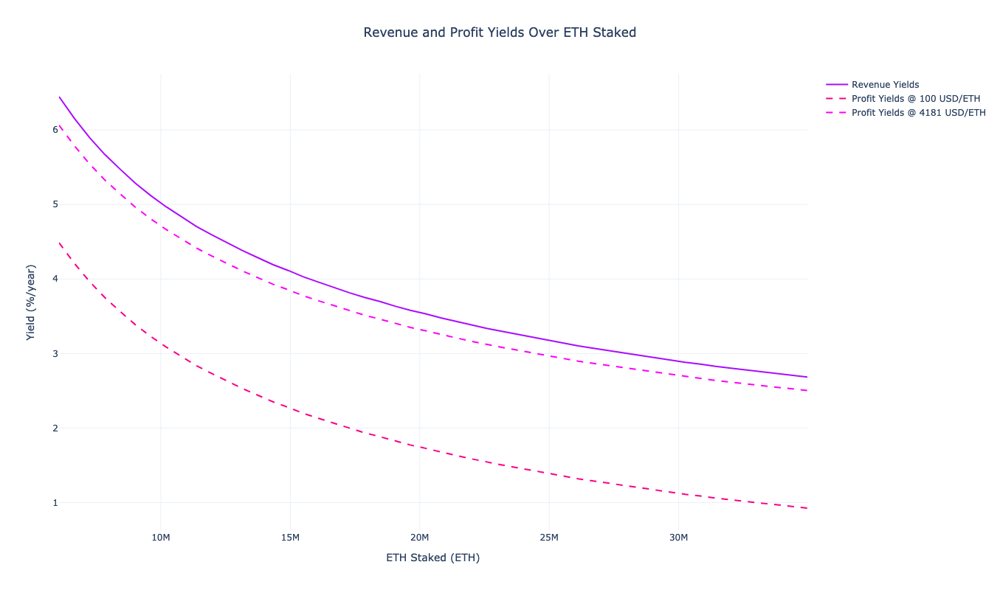

time: 61.9 ms (started: 2021-07-05 14:50:20 +02:00)


In [13]:
visualizations.plot_revenue_profit_yields_over_eth_staked(df_2)

# Analysis 3: Revenue and Profit Yields Over ETH Price

This analysis allows the exploration of revenue and profit yields over a large range of ETH prices (USD/ETH). Revenue yields are not sensitive to ETH price, hence the horizontal line. Profit yields drop quickly at very low ETH prices and stabilize at higher ETH prices.

In [14]:
simulation_3.model.params.update({
    'eth_staked_process': [
        lambda _run, _timestep: eth_staked,  # Current ETH staked value
    ]
})

time: 33.2 ms (started: 2021-07-05 14:50:20 +02:00)


In [15]:
df_3, _exceptions = run(simulation_3)

time: 218 ms (started: 2021-07-05 14:50:20 +02:00)


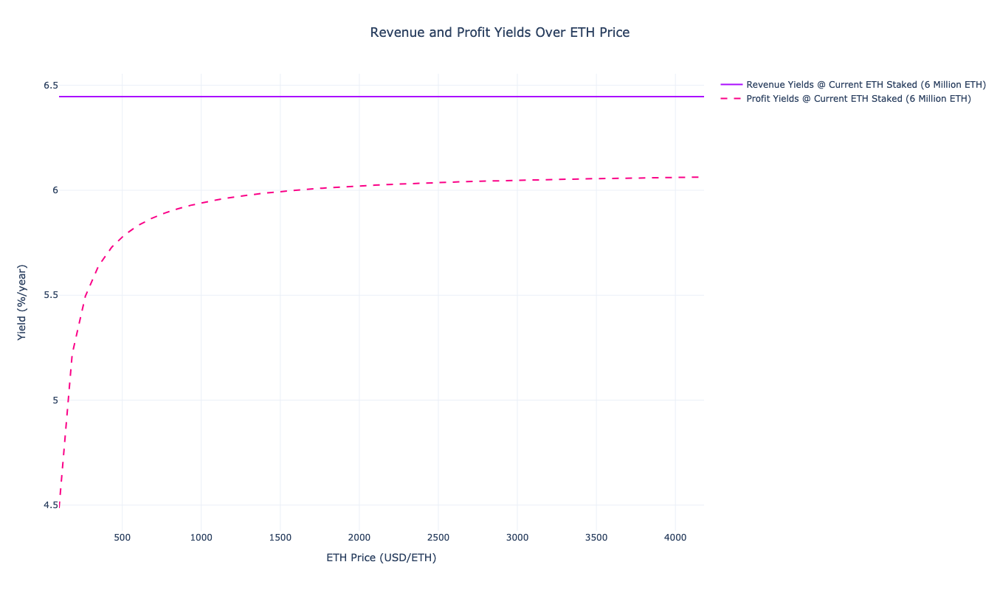

time: 45.7 ms (started: 2021-07-05 14:50:20 +02:00)


In [16]:
visualizations.plot_revenue_profit_yields_over_eth_price(df_3)

# Analysis 4: Profit Yields Over ETH Staked vs. ETH Price

This contour chart was created to enable at-a-glance intuition about the relationship between profit yields, validator adoption, and ETH price (and because we like colorful charts). Profit yields are highest when ETH price is high, and when adoption is low.

In [17]:
df_4, _exceptions = run(simulation_4)

time: 784 ms (started: 2021-07-05 14:50:20 +02:00)


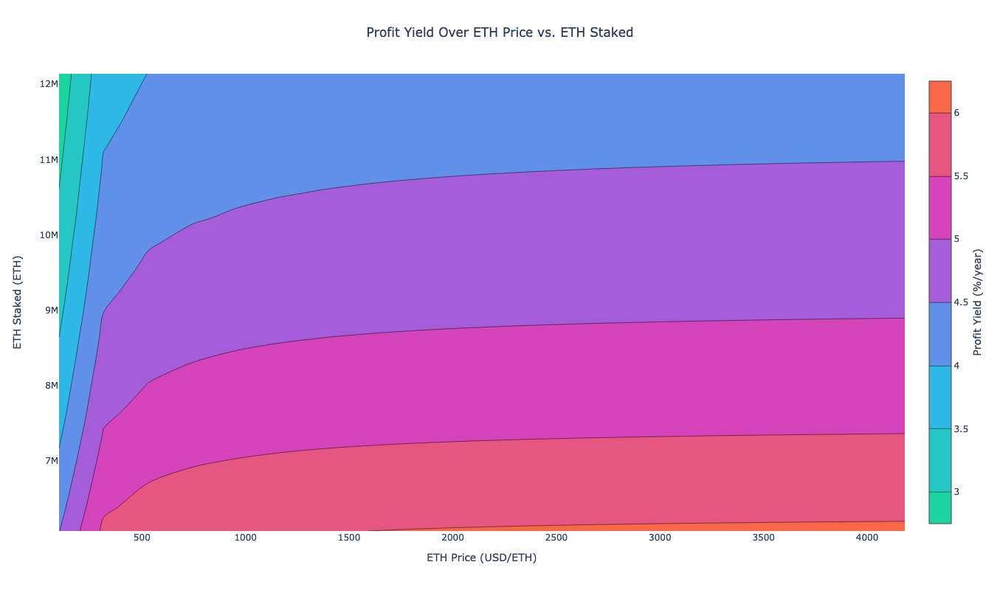

time: 166 ms (started: 2021-07-05 14:50:21 +02:00)


In [18]:
visualizations.plot_validator_environment_yield_contour(df_4)

This surface chart displays the same data as the charts above and is arguably less readable. But since some folks might appreciate the fanciness of a 3D plot, we decided to not kill it.

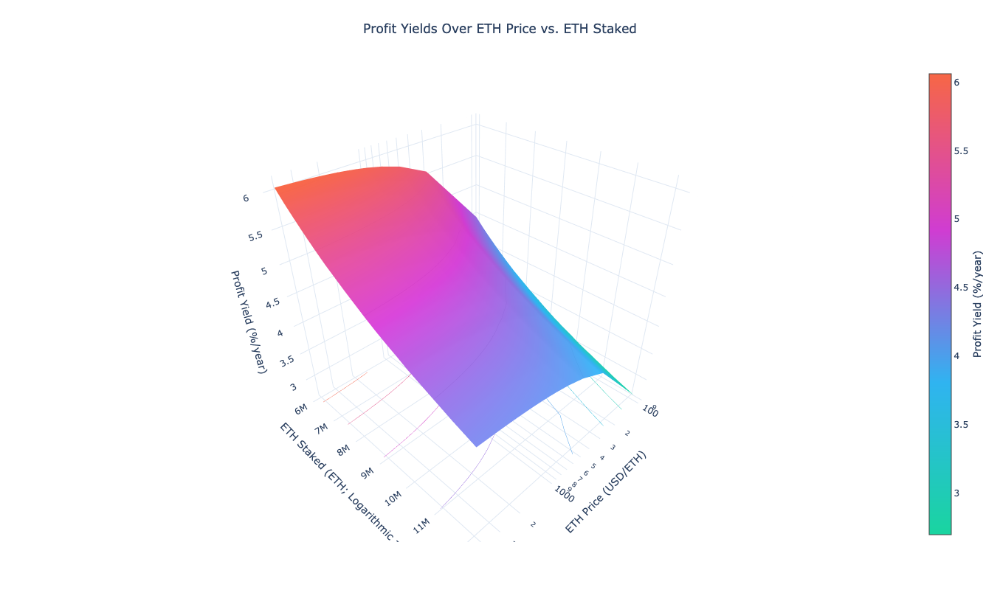

time: 238 ms (started: 2021-07-05 14:50:21 +02:00)


In [19]:
visualizations.plot_validator_environment_yield_surface(df_4)

# Analysis 5: Profit Yields By Validator Environment Over Time

This analysis allows the exploration of revenue and profit yields per validator environment over time. The analysis is based on the "Base Adoption" scenario described in Analysis 1. This analysis naturally heavily depends on the cost assumptions per validator environment, and we encourage the user to review the [assumptions document](../../ASSUMPTIONS.md) in this context. 

Please note the "custom" validator environment is currently set to the network average (average across all validator environments) (TODO: confirm), but can be customized to represent customized cost structures - see the default System Parameters in the `model.system_parameters` module.

In [20]:
simulation_5.model.params.update({'stage': [Stage.BEACON_CHAIN]})

time: 32.9 ms (started: 2021-07-05 14:50:21 +02:00)


In [21]:
df_5, _exceptions = run(simulation_5)

time: 1.54 s (started: 2021-07-05 14:50:21 +02:00)


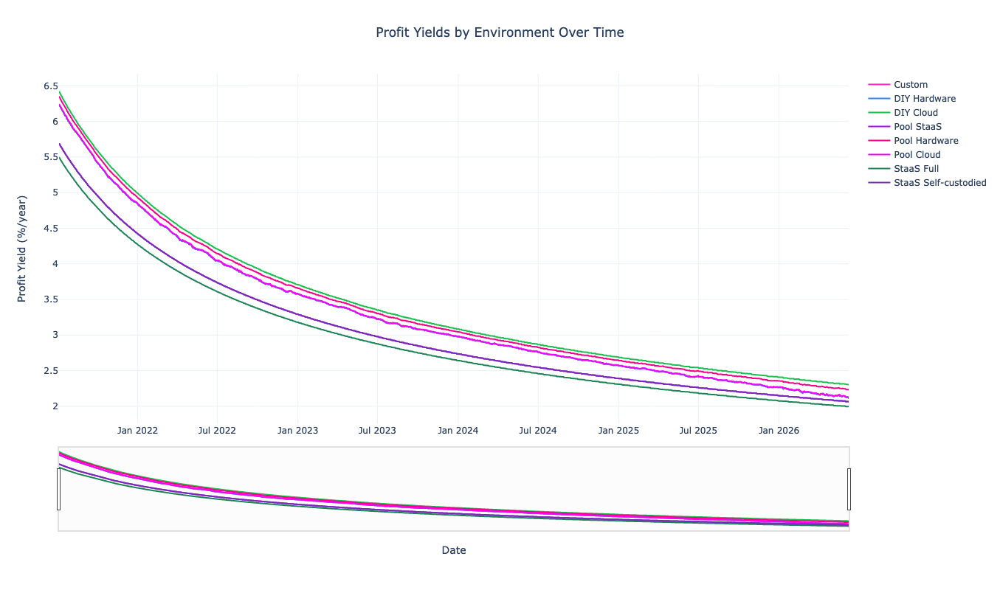

time: 588 ms (started: 2021-07-05 14:50:23 +02:00)


In [22]:
visualizations.plot_profit_yields_by_environment_over_time(df_5)